In [1]:
#hide
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 727kB 18.4MB/s 
     |████████████████████████████████| 194kB 51.8MB/s 
     |████████████████████████████████| 1.1MB 56.7MB/s 
     |████████████████████████████████| 51kB 8.0MB/s 
     |████████████████████████████████| 61kB 8.4MB/s 
Mounted at /content/gdrive


In [2]:
#hide
from fastbook import *
from fastai.vision.widgets import *

# clean
To download images with Bing Image Search, sign up at [Microsoft Azure](https://azure.microsoft.com/en-us/services/cognitive-services/bing-web-search-api/) for a free account. You will be given a key, which you can copy and enter in a cell as follows (replacing 'XXX' with your key and executing it):

### Beard Problem
So I sent my friend the link to my live web app to classify images into the mask and non-mask categories. He has a beard. My model didn't like this and said he had a mask when he didn't. This is an interesting issue as it could be reappear in the form of ethnicity or gender.


The next step is to tell the model to recognise that our bushy-faced friends are not wearing a mask. My initial thought is to introduce more images of people with beards into the training data as this will help with what seems to be an overfitting problem; the question is how many images do I add? 

Adding a new category entirely for bearded people might be better than trying to determine how many to include the current category.


When this is solved, testing again with people from more diverse ethnicities could highlight any further issues.

In [3]:
key = os.environ.get('AZURE_SEARCH_KEY', 'xx')

In [54]:
def search_images_bing(key, term, max_images: int = 150, **kwargs):    
    params = {'q':term, 'count':max_images}
    headers = {"Ocp-Apim-Subscription-Key":key}
    search_url = "https://api.bing.microsoft.com/v7.0/images/search"
    response = requests.get(search_url, headers=headers, params=params)
    response.raise_for_status()
    search_results = response.json() 
    return L(search_results['value'])

In [55]:
results = search_images_bing(key, 'people')
ims = results.attrgot('content_url')
len(ims)

150

In [56]:
path = Path('covid')

In [57]:
def make_category(cat, path, label):
  if not path.exists():
    path.mkdir()
  dest = (path/label)
  dest.mkdir(exist_ok=True)
  # Get results for bear
  results = search_images_bing(key, cat)
  download_images(dest, urls=results.attrgot('contentUrl')) 

In [74]:
make_category('peoples faces with covid mask', path, 'mask')
make_category('clean shaven face', path, 'no_mask')
make_category('bearded face', path, 'beard')

In [75]:
%ls covid

beard/  mask/  no_mask/


In [76]:
fns = get_image_files(path)
fns

(#511) [Path('covid/beard/00000053.jpg'),Path('covid/beard/00000124.jpg'),Path('covid/beard/00000071.JPG'),Path('covid/beard/00000023.jpg'),Path('covid/beard/00000092.jpg'),Path('covid/beard/00000030.jpg'),Path('covid/beard/00000103.jpg'),Path('covid/beard/00000117.jpg'),Path('covid/beard/00000134.jpg'),Path('covid/beard/00000027.jpg')...]

In [77]:
failed = verify_images(fns)
failed

(#4) [Path('covid/beard/00000066.jpg'),Path('covid/beard/00000046.jpg'),Path('covid/mask/00000061.jpg'),Path('covid/no_mask/00000083.jpg')]

In [78]:
failed.map(Path.unlink);

## From Data to DataLoaders

In [79]:
masks = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [80]:
dls = masks.dataloaders(path)

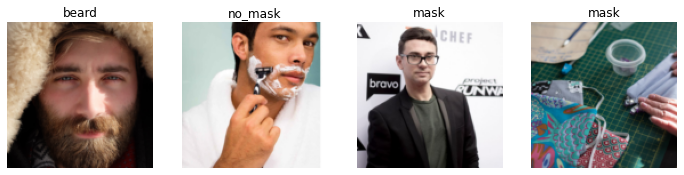

In [81]:
dls.valid.show_batch(max_n=4, nrows=1)

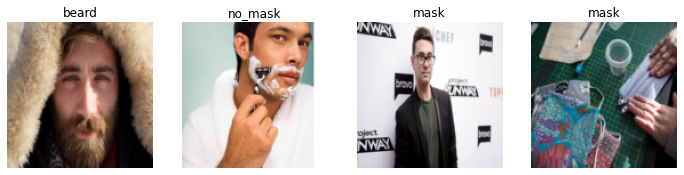

In [82]:
masks = masks.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = masks.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

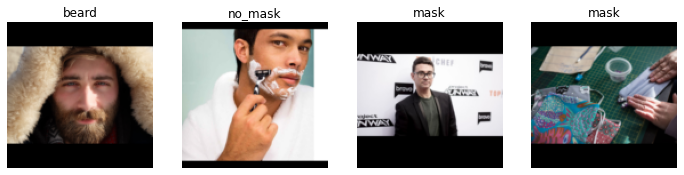

In [83]:
masks =masks.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = masks.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

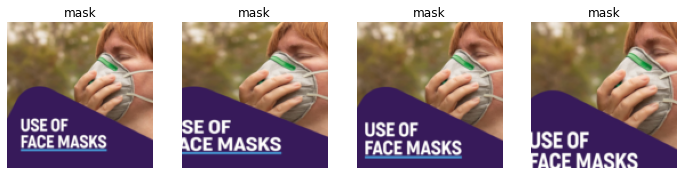

In [84]:
masks = masks.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = masks.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

## Training Your Model, and Using It to Clean Your Data

In [85]:
masks = masks.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = masks.dataloaders(path)

In [87]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(15)

epoch,train_loss,valid_loss,error_rate,time
0,1.608797,0.652087,0.267327,00:14


epoch,train_loss,valid_loss,error_rate,time
0,0.771061,0.543073,0.158416,00:14
1,0.755044,0.491430,0.138614,00:14
2,0.638298,0.434289,0.118812,00:14
3,0.556983,0.394881,0.099010,00:14
4,0.470054,0.413379,0.108911,00:14
5,0.420538,0.448249,0.128713,00:14
6,0.374124,0.482360,0.138614,00:14
7,0.329045,0.455877,0.108911,00:14
8,0.296579,0.419182,0.099010,00:14
9,0.258784,0.410373,0.099010,00:14


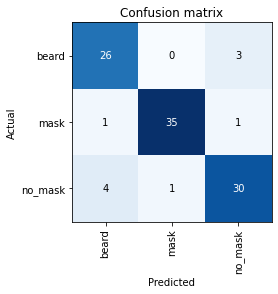

In [88]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

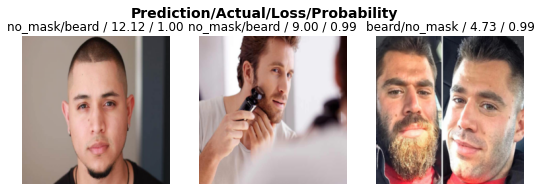

In [89]:
interp.plot_top_losses(3, nrows=1)

In [90]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [92]:
#hide
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

### Using the Model for Inference

In [93]:
learn.export()

In [94]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [101]:
%ls gdrive/MyDrive/Colab\ Notebooks

 03_ethics.ipynb         export.pkl   mdl_train-mask-classifier.ipynb
 04_mnist_basics.ipynb   FastAI/     'NP Vectorisation.ipynb'


In [98]:
%rm gdrive/MyDrive/Colab\ Notebooks/export.pkl

In [100]:
%cp export.pkl gdrive/MyDrive/Colab\ Notebooks/